In [1]:
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs


In [46]:
df_db_sfz = pd.read_table("../TFLearn/DB_SUM.txt")

In [47]:
df_db_sfz['SUM_CB_JE'] = df_db_sfz['SUM_CB_JE'].fillna(0)
df_db_sfz['SUM_FC_MJ'] = df_db_sfz['SUM_FC_MJ'].fillna(0)
df_db_sfz['SUM_GJJDK_JE'] = df_db_sfz['SUM_GJJDK_JE'].fillna(0)
df_db_sfz['SUM_GJJJN_JE'] = df_db_sfz['SUM_GJJJN_JE'].fillna(0)
df_db_sfz['SUM_SW_JE'] = df_db_sfz['SUM_SW_JE'].fillna(0)
df_db_sfz['SFZ'] = df_db_sfz['SFZ'].astype('str')
xb_mapping = {
           '男': 1,
           '女': 0}

df_db_sfz['XB'] = df_db_sfz['XB'].map(xb_mapping)
df_db_sfz.head(5)

,SFZ,SUM_CB,SUM_CL,SUM_FC,SUM_GJJDK,SUM_GJJJN,SUM_QY,SUM_SW,SUM_ALL,SUM_CB_JE,...,SUM_GJJDK_JE,SUM_GJJJN_JE,SUM_SW_JE,DB_HH,DB_JE,XB,NL,FL,XM,JDXZ
0,330602197503270517,1,0,0,0,0,0,0,1,625.86,...,0.0,0.0,0.00,2042091.0,540.0,1,43,2,陈立荣,曹娥街道
1,330622193001286217,0,0,0,0,0,0,1,1,0.00,...,0.0,0.0,14.25,15018331.0,503.0,1,88,1,唐永铨,丰惠镇
2,330622193005121428,0,0,0,0,0,0,1,1,0.00,...,0.0,0.0,32.40,7003622.0,460.0,0,88,1,王雅珍,盖北镇
3,330622193201208416,0,0,0,0,0,0,1,1,0.00,...,0.0,0.0,8.10,26005981.0,720.0,1,86,1,陈苗法,上浦镇
4,330622193606273611,0,0,0,0,0,0,1,1,0.00,...,0.0,0.0,4.50,27005240.0,655.0,1,82,1,章小兴,谢塘镇


In [48]:
df_db_sfz.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7723 entries, 0 to 7722
Data columns (total 21 columns):
SFZ             7723 non-null object
SUM_CB          7723 non-null int64
SUM_CL          7723 non-null int64
SUM_FC          7723 non-null int64
SUM_GJJDK       7723 non-null int64
SUM_GJJJN       7723 non-null int64
SUM_QY          7723 non-null int64
SUM_SW          7723 non-null int64
SUM_ALL         7723 non-null int64
SUM_CB_JE       7723 non-null float64
SUM_FC_MJ       7723 non-null float64
SUM_GJJDK_JE    7723 non-null float64
SUM_GJJJN_JE    7723 non-null float64
SUM_SW_JE       7723 non-null float64
DB_HH           7720 non-null float64
DB_JE           7723 non-null float64
XB              7723 non-null int64
NL              7723 non-null int64
FL              7723 non-null int64
XM              7723 non-null object
JDXZ            7723 non-null object
dtypes: float64(7), int64(11), object(3)
memory usage: 1.2+ MB


In [49]:
print(df_db_sfz.shape)
# df_db_sfz1 = df_db_sfz[(df_db_sfz['SUM_GJJDK_JE'] == 130000)]
# df_db_sfz = df_db_sfz[(df_db_sfz['SFZ'] != '330622196604048414')]
print(df_db_sfz.shape)
# print(df_db_sfz1.shape)
# print(df_db_sfz2.shape)
# print(df_db_sfz1)
df_db_sfz_num  = df_db_sfz.drop(['SFZ'],1)
df_db_sfz_num.info()

(7723, 21)
(7723, 21)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7723 entries, 0 to 7722
Data columns (total 20 columns):
SUM_CB          7723 non-null int64
SUM_CL          7723 non-null int64
SUM_FC          7723 non-null int64
SUM_GJJDK       7723 non-null int64
SUM_GJJJN       7723 non-null int64
SUM_QY          7723 non-null int64
SUM_SW          7723 non-null int64
SUM_ALL         7723 non-null int64
SUM_CB_JE       7723 non-null float64
SUM_FC_MJ       7723 non-null float64
SUM_GJJDK_JE    7723 non-null float64
SUM_GJJJN_JE    7723 non-null float64
SUM_SW_JE       7723 non-null float64
DB_HH           7720 non-null float64
DB_JE           7723 non-null float64
XB              7723 non-null int64
NL              7723 non-null int64
FL              7723 non-null int64
XM              7723 non-null object
JDXZ            7723 non-null object
dtypes: float64(7), int64(11), object(2)
memory usage: 1.2+ MB


In [50]:
np_db_sfz = np.array(df_db_sfz_num)

In [96]:
# np_db_sfz_1 = np.array(df_db_sfz_num[['SUM_CB_JE','SUM_FC_MJ','SUM_GJJDK_JE','SUM_GJJJN_JE','SUM_SW_JE']])
np_db_sfz_1 = np.array(df_db_sfz_num[['SUM_CB_JE','SUM_GJJJN_JE','SUM_SW_JE']])
np_db_sfz_1_sum = np.array(np.sum(np_db_sfz_1,axis=1))
np_db_sfz_2 = np.array(df_db_sfz_num['SUM_ALL']) 
np_db_sfz_3 = np.array(df_db_sfz_num['DB_JE']) 
np_db_sfz_4 = np.array(df_db_sfz_num['NL']) 

np_db_sfz_5 = np.array(df_db_sfz_num['XB']) 

np_db_sum_AJE_XS = np.vstack((np_db_sfz_1_sum,np_db_sfz_2)).T
np_db_sum_AJE_DBJE = np.vstack((np_db_sfz_1_sum,np_db_sfz_3)).T
np_db_sum_XS_DBJE = np.vstack((np_db_sfz_2,np_db_sfz_3)).T


np_db_sum_XS_NL = np.vstack((np_db_sfz_4,np_db_sfz_2)).T
# print('np_db_sum_XS_NL',np_db_sum_XS_NL)
np_db_sum_AJE_NL = np.vstack((np_db_sfz_4,np_db_sfz_1_sum)).T
# print('np_db_sum_AJE_NL',np_db_sum_AJE_NL)
np_db_sum_XS_XB = np.vstack((np_db_sfz_5,np_db_sfz_2)).T

np_db_sum_XS_AJE_NL = np.vstack((np_db_sfz_2,np_db_sfz_4,np_db_sfz_1_sum)).T

np_db_sum_ALL =  np.vstack((np_db_sfz_1_sum,np_db_sfz_2,np_db_sfz_3)).T


df_db_sum_ALL = pd.DataFrame(np_db_sum_ALL)
dp_db_sum_XS_XB = pd.DataFrame(np_db_sum_XS_XB)
df_db_sum_AJE_NL = pd.DataFrame(np_db_sum_AJE_NL)
df_db_sum_XS_AJE_NL = pd.DataFrame(np_db_sum_XS_AJE_NL)


# 添加列名
df_db_sum_ALL.columns = ['AJE','XS', 'DBJE']
dp_db_sum_XS_XB.columns = ['XB','XS']
df_db_sum_AJE_NL.columns = ['NL','AJE']
df_db_sum_XS_AJE_NL.columns = ['XS','NL','AJE']


In [54]:
df_db_sum_XS_AJE_NL.head(5)


,XS,NL,AJE
0,1.0,43.0,625.86
1,1.0,88.0,14.25
2,1.0,88.0,32.40
3,1.0,86.0,8.10
4,1.0,82.0,4.50


In [53]:
print(np_db_sum_XS_AJE_NL)

[[  1.    43.   625.86]
 [  1.    88.    14.25]
 [  1.    88.    32.4 ]
 ...
 [  1.    80.     1.8 ]
 [  1.    67.    62.1 ]
 [  1.    68.     8.1 ]]


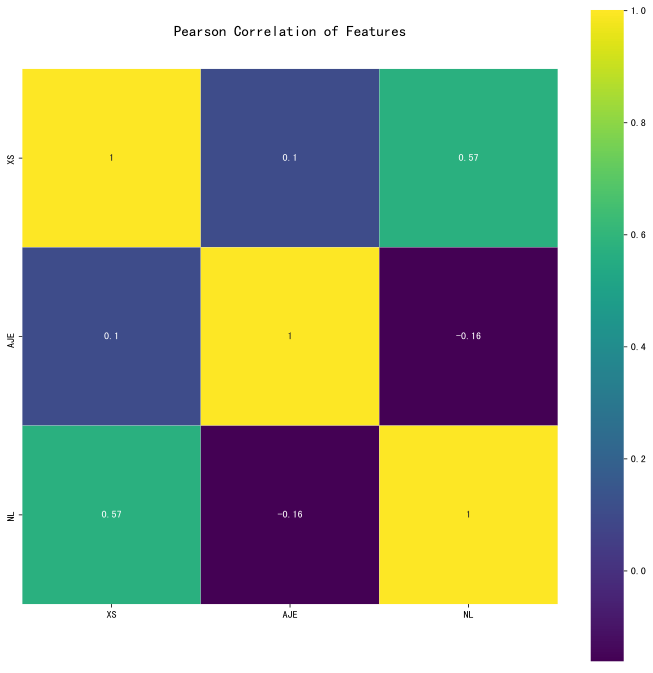

In [21]:
colormap = plt.cm.viridis
plt.figure(figsize=(12,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(df_db_sum_XS_AJE_NL.astype(float).corr(),linewidths=0.1,vmax=1.0, square=True, cmap=colormap, linecolor='white', annot=True, xticklabels=True, yticklabels=True)

<Figure size 432x288 with 0 Axes>

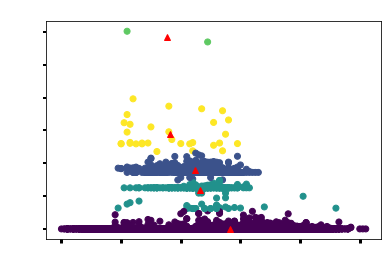

In [31]:
plt.figure()
X = np_db_sum_AJE_NL
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

xy=estimator.cluster_centers_

np.set_printoptions(threshold=20)

fig, ax = plt.subplots()
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.plot(xy[:,0],xy[:,1],'r^')
plt.title("DB",color='white')
plt.xlabel('NL ',color='white')
plt.ylabel('XS ',color='white')
ax.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
ax.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)
# ymajorLocator = MultipleLocator(1)
# ax.yaxis.set_major_locator(ymajorLocator)

[2 0 0 ... 1 3 1]


<Figure size 432x288 with 0 Axes>

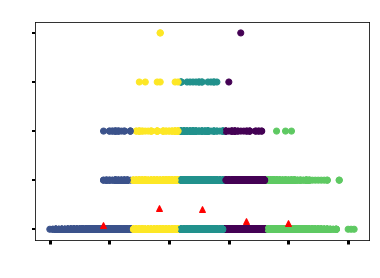

In [23]:
plt.figure()
X = np_db_sum_XS_NL
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

xy=estimator.cluster_centers_

np.set_printoptions(threshold=20)
print(y_pred)
# np.savetxt("y_pred.txt", y_pred, fmt="%d", delimiter=",")
# np.savetxt("xy.txt", xy, fmt="%d", delimiter=",")


fig, ax = plt.subplots()
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.plot(xy[:,0],xy[:,1],'r^')
plt.title("DB",color='white')
plt.xlabel('NL ',color='white')
plt.ylabel('XS ',color='white')
ax.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
ax.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)
ymajorLocator = MultipleLocator(1)
ax.yaxis.set_major_locator(ymajorLocator)

[0 2 0 ... 0 2 0]


<Figure size 432x288 with 0 Axes>

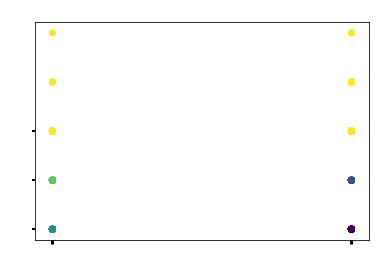

In [49]:
plt.figure()
X = np_db_sum_XS_XB
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

xy=estimator.cluster_centers_

np.set_printoptions(threshold=20)
print(y_pred)
# np.savetxt("y_pred.txt", y_pred, fmt="%d", delimiter=",")
# np.savetxt("xy.txt", xy, fmt="%d", delimiter=",")


fig, ax = plt.subplots()
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
# plt.plot(xy[:,0],xy[:,1],'r^')
plt.title("DB",color='white')
plt.xlabel('XB ',color='white')
plt.ylabel('XS ',color='white')
ax.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
ax.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)
ymajorLocator = MultipleLocator(1)
ax.yaxis.set_major_locator(ymajorLocator)
ax.xaxis.set_major_locator(ymajorLocator)

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6499: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


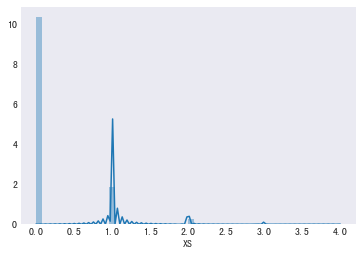

In [21]:
# _, axes = plt.subplots(1, figsize=(6, 4))
# sns.boxplot(data=df['age'], ax=axes[0]); sns.violinplot(data=df['age'], ax=axes[1]);
# dp_db_sum_XS_XB_loc = dp_db_sum_XS_XB.loc[dp_db_sum_XS_XB['XS'] > 0 ]
# f,ax=plt.subplots(1,figsize=(18,8))
# sns.violinplot("XB","XS", data=dp_db_sum_XS_XB_loc,ax=ax)

# # ax.set_title('xb and age vs SFSG')
# # ax.set_yticks(range(0,110,10))
# plt.show()
# plt.rcParams['font.family']=['STFangsong']
# from matplotlib.font_manager import _rebuild
# _rebuild()
# plt.rcParams['font.sans-serif'] = ['SimHei']  
# _, axes = plt.subplots(1,2, figsize=(12, 6))
# dp_db_sum_XS_XB_loc = dp_db_sum_XS_XB.loc[dp_db_sum_XS_XB['XB'] == 0 ]
# sns.distplot(dp_db_sum_XS_XB_loc['XS'], kde=False, ax=axes[0],hist=True)
# sns.distplot(dp_db_sum_XS_XB_loc['XS'], ax=axes[0] )
# sns.set_style('dark')
# xmajorLocator = MultipleLocator(1)
# axes[0].xaxis.set_major_locator(xmajorLocator)
# axes[0].set_title('女')

# dp_db_sum_XS_XB_loc1 = dp_db_sum_XS_XB.loc[dp_db_sum_XS_XB['XB'] == 1 ]
# sns.distplot(dp_db_sum_XS_XB_loc1['XS'], kde=False, ax=axes[1],hist=True)
# xmajorLocator = MultipleLocator(1)
# axes[1].xaxis.set_major_locator(xmajorLocator)
# axes[1].set_title('男')

# plt.show()

def hist_viz(df,feature):
    ax = sns.distplot(df[feature])
    plt.xlabel(feature)
    plt.show()

hist_viz(dp_db_sum_XS_XB_loc,'XS')

<Figure size 432x288 with 0 Axes>

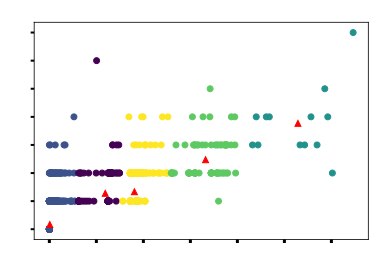

In [89]:

 
plt.figure()
X = np_db_sum_AJE_XS
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

xy=estimator.cluster_centers_

np.set_printoptions(threshold=20)
print(y_pred)
# np.savetxt("y_pred.txt", y_pred, fmt="%d", delimiter=",")
# np.savetxt("xy.txt", xy, fmt="%d", delimiter=",")


fig, ax = plt.subplots()
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.plot(xy[:,0],xy[:,1],'r^')
plt.title("DB",color='white')
plt.xlabel('AJE ',color='white')
plt.ylabel('XS ',color='white')
ax.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
ax.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)
ymajorLocator = MultipleLocator(1)
ax.yaxis.set_major_locator(ymajorLocator)

[0 2 2 ... 2 0 4]


<Figure size 432x288 with 0 Axes>

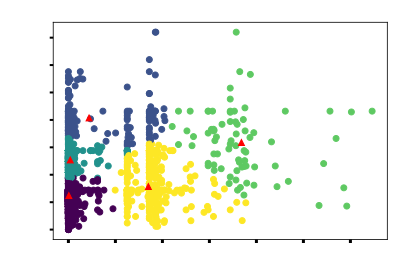

In [92]:
plt.figure()
X = np_db_sum_AJE_DBJE
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

xy=estimator.cluster_centers_

np.set_printoptions(threshold=20)

print(y_pred)
# np.savetxt("y_pred.txt", y_pred, fmt="%d", delimiter=",")
# np.savetxt("xy.txt", xy, fmt="%d", delimiter=",")

fig, ax = plt.subplots()
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.plot(xy[:,0],xy[:,1],'r^')
plt.title("DB",color='white')
plt.xlabel('AJE ',color='white')
plt.ylabel('DBJE ',color='white')
ax.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
ax.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)

[0 2 2 ... 2 3 0]


<Figure size 432x288 with 0 Axes>

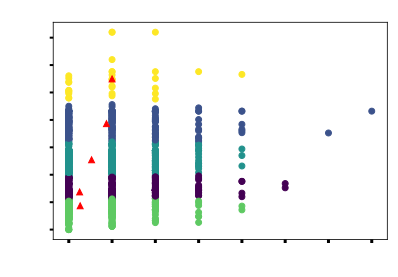

In [93]:

plt.figure()
X = np_db_sum_XS_DBJE
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

xy=estimator.cluster_centers_

np.set_printoptions(threshold=20)

print(y_pred)
# np.savetxt("y_pred.txt", y_pred, fmt="%d", delimiter=",")
# np.savetxt("xy.txt", xy, fmt="%d", delimiter=",")


fig, ax = plt.subplots()
plt.scatter(X[:, 0], X[:, 1], c=y_pred)
plt.plot(xy[:,0],xy[:,1],'r^')
plt.title("DB",color='white')
plt.xlabel('XS ',color='white')
plt.ylabel('DBJE ',color='white')
ax.tick_params(axis='x',labelcolor='white', labelsize='medium', width=3)
ax.tick_params(axis='y',labelcolor='white', labelsize='medium', width=2)

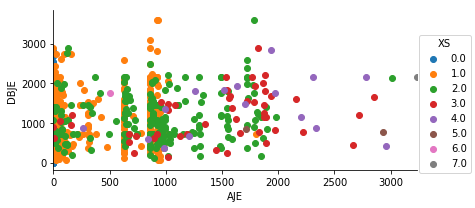

In [83]:
facet = sns.FacetGrid(df_db_sum_ALL, hue="XS",aspect=2)
# facet.map(sns.kdeplot,'AJE','DBJE',shade= True)
facet.map(plt.scatter,'AJE','DBJE')
facet.set(xlim=(0, df_db_sum_ALL['AJE'].max()))
facet.add_legend()

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


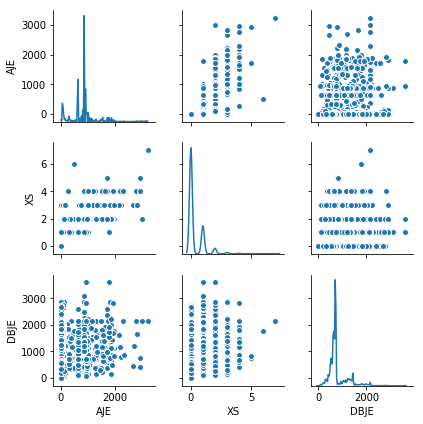

In [84]:
def splom_viz(df, labels=None):
    ax = sns.pairplot(df, hue=labels, diag_kind='kde', size=2)
    plt.show()
    

splom_viz(df_db_sum_ALL)

In [97]:
X = np_db_sum_XS_AJE_NL
estimator= KMeans(n_clusters=5)
y_pred =estimator.fit_predict(X)

np.savetxt("np_db_sum_XS_AJE_NL.txt", np_db_sum_XS_AJE_NL, fmt="%d", delimiter=",")
np.savetxt("y_pred.txt", y_pred, fmt="%d", delimiter=",")
df_db_sum_XS_AJE_NL.to_csv("df_db_sum_XS_AJE_NL.csv")
# np.savetxt("xy.txt", xy, fmt="%d", delimiter=",")


In [56]:
print(np_db_sum_XS_AJE_NL.size)

23169


[9. 6.]


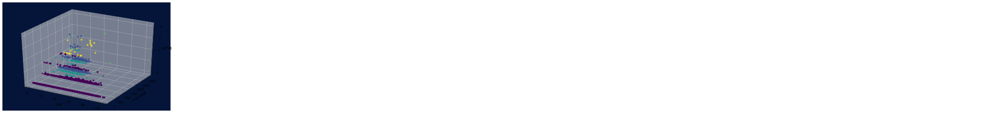

In [113]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
%config InlineBackend.figure_format = 'svg'
fig = plt.figure(figsize=(9, 6))
# fig.set_facecolor('black')
axes = fig.add_subplot(111, projection='3d')

# fig = plt.subplots(1, figsize=(18, 8))

data = df_db_sum_XS_AJE_NL
x,y,z= data['NL'],data['AJE'],data['XS']

# 创建三维对象
# fig= plt.figure(figsize=(18, 8))
# ax = Axes3D(fig)
# axes = Axes3D(fig)
print(fig.get_size_inches())
# 绘制散点图
axes.scatter(x[:],y[:],z[:],c=y_pred)
# axes.scatter(x[:],y[:],z[:],c='r')
# axes.scatter(x[:],y[:],z[:],c='g')
# axes.patch.set_facecolor('black')
axes.patch.set_color('#051539')
# axes.patch.set_edgecolor('red')
zmajorLocator = MultipleLocator(1)
axes.zaxis.set_major_locator(zmajorLocator)
axes.xaxis.set_label_text('年龄')
axes.yaxis.set_label_text('月支出金额')
axes.zaxis.set_label_text('资产数')
# plt.xlabel('年龄  ',color='white')
# plt.ylabel('支出金额 ',color='white')
# plt.zlabel('资产数 ',color='white')
# 显示图像
plt.grid(colors='w')
plt.show()

In [89]:
from pyecharts import Scatter3D
from pyecharts import configure
import random
# data = [
#     [random.randint(0, 100),
#     random.randint(0, 100),
#     random.randint(0, 100)] for _ in range(80)
# ]
configure(global_theme='dark')
range_color = [
    '#313695', '#4575b4', '#74add1', '#abd9e9', '#e0f3f8', '#ffffbf',
    '#fee090', '#fdae61', '#f46d43', '#d73027', '#a50026']
scatter3D = Scatter3D("3D 散点图示例", width=1200, height=600)
print(type(range_color))
print(type(y_pred))
print(y_pred.size)

scatter3D.add("", np_db_sum_XS_AJE_NL, is_visualmap=True, visual_range_color=y_pred.all())
# scatter3D

<class 'list'>
<class 'numpy.ndarray'>
7723


number of estimated clusters : 12
12


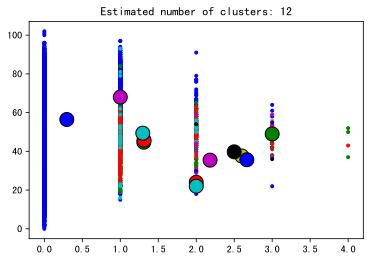

In [117]:
# Mean Shift
import numpy as np
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.datasets.samples_generator import make_blobs



# #############################################################################
# Compute clustering with MeanShift

# The following bandwidth can be automatically detected using
bandwidth = estimate_bandwidth(X, quantile=0.2, n_samples=500)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(np_db_sum_XS_AJE_NL)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)
 
# #############################################################################
# Plot result
import matplotlib.pyplot as plt
from itertools import cycle

plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
# print(colors.size)
print(n_clusters_)
for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
    cluster_center = cluster_centers[k]
    plt.plot(X[my_members, 0], X[my_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

In [128]:
# Affinity Propagation
from sklearn.cluster import AffinityPropagation
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs

# #############################################################################
# Generate sample data
# centers = [[1, 1], [-1, -1], [1, -1]]
# X, labels_true = make_blobs(n_samples=300, centers=centers, cluster_std=0.5,
#                             random_state=0)

# #############################################################################
# Compute Affinity Propagation
X = np_db_sum_XS_AJE_NL
af = AffinityPropagation(preference=-50).fit(X)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

# print('Estimated number of clusters: %d' % n_clusters_)
# print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
# print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
# print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
# print("Adjusted Rand Index: %0.3f"
#       % metrics.adjusted_rand_score(labels_true, labels))
# print("Adjusted Mutual Information: %0.3f"
#       % metrics.adjusted_mutual_info_score(labels_true, labels))
# print("Silhouette Coefficient: %0.3f"
#       % metrics.silhouette_score(X, labels, metric='sqeuclidean'))

# #############################################################################
# Plot result
import matplotlib.pyplot as plt
from itertools import cycle

plt.close('all')
plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    class_members = labels == k
#     print(class_members.size)
#     print(k)
#     print(cluster_centers_indices.size)
    cluster_center = X[cluster_centers_indices[k]]
    plt.plot(X[class_members, 0], X[class_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    for x in X[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

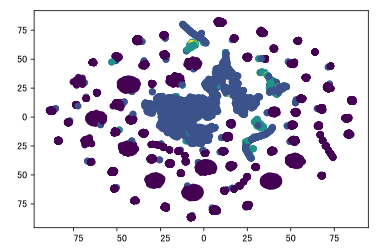

In [137]:
# Importing Modules
from sklearn import datasets
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Loading dataset
# iris_df = df_db_sum_XS_AJE_NL

# Defining Model
model = TSNE(learning_rate=100)

# Fitting Model
transformed = model.fit_transform(df_db_sum_XS_AJE_NL)

# Plotting 2d t-Sne
x_axis = transformed[:, 0]
y_axis = transformed[:, 1]

plt.scatter(x_axis, y_axis, c=df_db_sum_XS_AJE_NL['XS'])
plt.show()

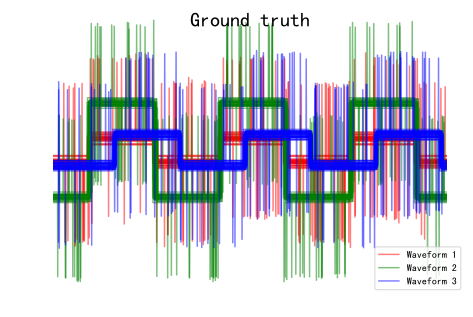

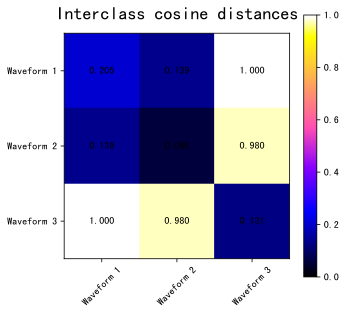

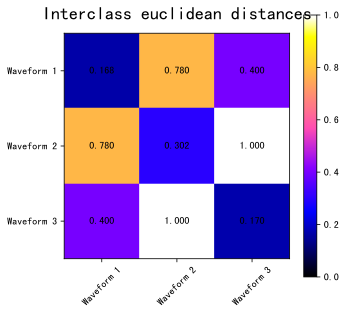

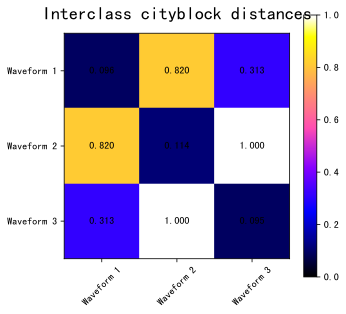

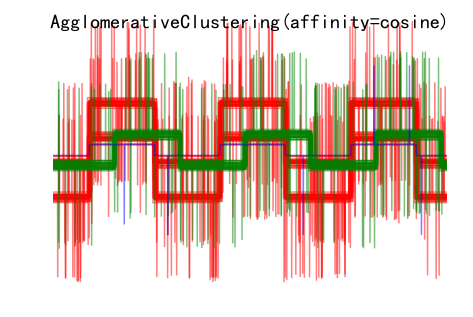

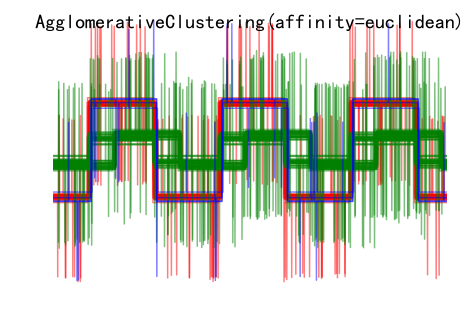

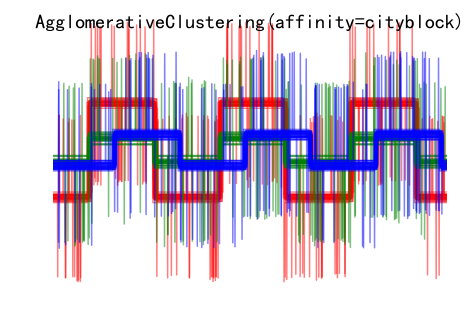

In [138]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances

np.random.seed(0)

# Generate waveform data
n_features = 2000
t = np.pi * np.linspace(0, 1, n_features)


def sqr(x):
    return np.sign(np.cos(x))

X = list()
y = list()
for i, (phi, a) in enumerate([(.5, .15), (.5, .6), (.3, .2)]):
    for _ in range(30):
        phase_noise = .01 * np.random.normal()
        amplitude_noise = .04 * np.random.normal()
        additional_noise = 1 - 2 * np.random.rand(n_features)
        # Make the noise sparse
        additional_noise[np.abs(additional_noise) < .997] = 0

        X.append(12 * ((a + amplitude_noise)
                 * (sqr(6 * (t + phi + phase_noise)))
                 + additional_noise))
        y.append(i)

X = np.array(X)
y = np.array(y)

n_clusters = 3

labels = ('Waveform 1', 'Waveform 2', 'Waveform 3')

# Plot the ground-truth labelling
plt.figure()
plt.axes([0, 0, 1, 1])
for l, c, n in zip(range(n_clusters), 'rgb',
                   labels):
    lines = plt.plot(X[y == l].T, c=c, alpha=.5)
    lines[0].set_label(n)

plt.legend(loc='best')

plt.axis('tight')
plt.axis('off')
plt.suptitle("Ground truth", size=20)


# Plot the distances
for index, metric in enumerate(["cosine", "euclidean", "cityblock"]):
    avg_dist = np.zeros((n_clusters, n_clusters))
    plt.figure(figsize=(5, 4.5))
    for i in range(n_clusters):
        for j in range(n_clusters):
            avg_dist[i, j] = pairwise_distances(X[y == i], X[y == j],
                                                metric=metric).mean()
    avg_dist /= avg_dist.max()
    for i in range(n_clusters):
        for j in range(n_clusters):
            plt.text(i, j, '%5.3f' % avg_dist[i, j],
                     verticalalignment='center',
                     horizontalalignment='center')

    plt.imshow(avg_dist, interpolation='nearest', cmap=plt.cm.gnuplot2,
               vmin=0)
    plt.xticks(range(n_clusters), labels, rotation=45)
    plt.yticks(range(n_clusters), labels)
    plt.colorbar()
    plt.suptitle("Interclass %s distances" % metric, size=18)
    plt.tight_layout()


# Plot clustering results
for index, metric in enumerate(["cosine", "euclidean", "cityblock"]):
    model = AgglomerativeClustering(n_clusters=n_clusters,
                                    linkage="average", affinity=metric)
    model.fit(X)
    plt.figure()
    plt.axes([0, 0, 1, 1])
    for l, c in zip(np.arange(model.n_clusters), 'rgbk'):
        plt.plot(X[model.labels_ == l].T, c=c, alpha=.5)
    plt.axis('tight')
    plt.axis('off')
    plt.suptitle("AgglomerativeClustering(affinity=%s)" % metric, size=20)


plt.show()

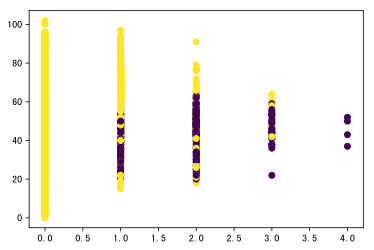

In [149]:
ward = AgglomerativeClustering(
    n_clusters=2,
    affinity='euclidean',
    linkage='ward',
    compute_full_tree='false').fit(np_db_sum_XS_AJE_NL)
plt.scatter(np_db_sum_XS_AJE_NL[:, 0], np_db_sum_XS_AJE_NL[:, 1], c=ward.labels_)